In [121]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.graph_objects as go 
import sys
# Adjust the path below to the path of your `module_directory`
sys.path.append('../thesis-2p-behavior-align/')
# Now you can import your module or function
import imaging_behavior_functions
import odor_behavioral_analysis
import scipy.cluster.hierarchy as sch
from rastermap import Rastermap, utils

In [17]:
base_path = "C:/Users/wilson/OneDrive - Harvard University/Thesis - Wilson lab/2P imaging/preprocessed data/qualified_sessions/multi_trial_sessions/"
example_path_data = base_path+"20231205-3_hDeltaB_tomogcamp7f_20dur_60isi/data/"
example_path_results = base_path+"20231205-3_hDeltaB_tomogcamp7f_20dur_60isi/results/"
trial_num = 1
odor_threshold = 5
time_interval_threshold = 16  # Assuming time is in seconds or an equivalent unit
k = 8
window_size = 30

is_mat73, roi_df, dff_raw, kinematics_raw, preprocessed_vars_ds, preprocessed_vars_odor = imaging_behavior_functions.load_intermediate_mat(example_path_data,trial_num)
behav_df = imaging_behavior_functions.make_df_behavior(dff_raw, preprocessed_vars_ds, preprocessed_vars_odor,trial_num,ball_d = 9)
xPos, yPos = imaging_behavior_functions.reconstruct_path(behav_df, ball_d = 9)
roi_names, hdeltab_index, epg_index, hdeltab_sequence, epg_sequence = imaging_behavior_functions.get_roi_seq(roi_df)
dff_all_rois, dff_time = imaging_behavior_functions.load_dff_raw(is_mat73, dff_raw)
neural_df = imaging_behavior_functions.make_df_neural(dff_all_rois, dff_time, roi_names, hdeltab_index, epg_index, hdeltab_sequence, epg_sequence)
behav_df, padded_result_df, smoothed_df = odor_behavioral_analysis.analysis_dfs(behav_df, time_interval_threshold, k, window_size)
combined_df = imaging_behavior_functions.combine_df(behav_df, neural_df)
smoothed_df["translationalV_smoothed"] = np.sqrt(smoothed_df["fwV_smoothed"]**2+smoothed_df["sideV_smoothed"]**2)

In [23]:
selected_df = neural_df.drop(columns=['time'])
selected_df

,hDeltaB_0,hDeltaB_1,hDeltaB_2,hDeltaB_3,hDeltaB_4,hDeltaB_5,hDeltaB_6,hDeltaB_7,hDeltaB_8,hDeltaB_9,...,hDeltaB_17,hDeltaB_18,hDeltaB_19,hDeltaB_20,hDeltaB_21,hDeltaB_22,hDeltaB_23,hDeltaB_24,hDeltaB_25,hDeltaB_26
0,0.120941,-0.015579,0.024259,0.025294,-0.073120,-0.098666,0.069836,-0.229273,-0.120880,0.133626,...,0.224973,0.117983,0.035856,-0.059405,0.005762,-0.083947,-0.116292,-0.007838,0.200136,0.065967
1,0.024430,0.058550,-0.002409,0.034700,-0.094542,-0.116711,0.072951,-0.114038,-0.096511,0.165598,...,0.226983,0.094362,-0.040114,-0.035405,-0.024805,-0.095816,-0.128843,0.029019,0.181912,0.177473
2,-0.120164,0.117824,0.043765,0.056346,-0.137873,-0.121473,0.065103,-0.001189,-0.043350,0.174913,...,0.241533,0.102702,-0.053874,-0.002053,-0.048078,-0.081334,-0.094361,0.079765,0.210308,0.454714
3,-0.207342,0.117534,0.152256,0.088161,-0.116555,-0.079866,0.077096,0.057527,-0.001724,0.111320,...,0.247535,0.158649,-0.001923,0.025755,-0.034742,-0.036108,-0.018751,0.101192,0.265153,0.748812
4,-0.156834,0.085705,0.170889,0.066314,-0.053314,-0.021688,0.117241,0.042863,-0.007837,0.066020,...,0.227619,0.178939,0.043287,0.045997,-0.029222,-0.033925,0.027570,0.061499,0.275215,0.707746
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3549,0.299384,0.219595,0.229648,0.147286,0.197321,0.075861,0.055487,0.133786,0.160176,0.256177,...,0.438771,0.444116,0.337849,0.258039,0.320124,0.217587,0.154266,0.222569,0.208403,0.241724
3550,0.189099,0.151500,0.210810,0.159072,0.149227,0.107545,0.064901,0.142766,0.155309,0.260334,...,0.456776,0.395560,0.378137,0.279545,0.332755,0.246045,0.132332,0.176111,0.239903,0.257574
3551,0.153629,0.146739,0.143984,0.176096,0.128196,0.125074,0.063911,0.155056,0.170933,0.195818,...,0.469919,0.339803,0.402883,0.295405,0.390441,0.293319,0.173733,0.209161,0.223809,0.235760
3552,0.206502,0.163018,0.137663,0.132580,0.173372,0.113197,0.047625,0.083378,0.157292,0.175033,...,0.471220,0.347820,0.370111,0.278224,0.401230,0.268145,0.205523,0.261350,0.195697,0.201817


In [25]:
roi_kw = 'hDeltaB'
roi_mtx = imaging_behavior_functions.extract_heatmap(neural_df, roi_kw, 1, example_path_results, trial_num)
param_df = imaging_behavior_functions.fit_sinusoid(neural_df,roi_mtx)
param_df

,time,phase,baseline,amplitude,phase_error,baseline_error,amplitude_error
0,0.000000,4.108237,-1.300744,0.127538,0.895337,0.080957,0.114830
1,0.171684,3.383254,-1.307567,0.053387,2.062644,0.076638,0.106618
2,0.343367,2.174949,-1.235913,0.019774,6.100676,0.085619,0.121532
3,0.515051,5.799863,-1.117987,0.066730,2.103905,0.098473,0.138120
4,0.686734,5.799863,-1.124650,0.153654,0.835280,0.090118,0.126543
...,...,...,...,...,...,...,...
3549,609.304905,3.866576,-0.301285,0.621081,0.136700,0.059758,0.084122
3550,609.476588,3.866576,-0.331932,0.622238,0.126028,0.055256,0.077868
3551,609.648272,4.108237,-0.361576,0.608317,0.117418,0.050654,0.071844
3552,609.819955,4.349898,-0.447283,0.570854,0.110094,0.044903,0.064154


In [126]:
base_dir = 'C:/Users/wilson/OneDrive - Harvard University/Thesis - Wilson lab/2P imaging/scopa inspect/denoised suite2p test/whole_cropped_denoise/suite2p/plane0'
F = np.load(base_dir+'/F.npy', allow_pickle=True)
Fneu = np.load(base_dir+'/Fneu.npy', allow_pickle=True)
spks = np.load(base_dir+'/spks.npy', allow_pickle=True)
stat = np.load(base_dir+'/stat.npy', allow_pickle=True)
ops =  np.load(base_dir+'/ops.npy', allow_pickle=True)
ops = ops.item()
iscell = np.load(base_dir+'/iscell.npy', allow_pickle=True)

In [127]:
F_cell = F[(iscell[:,0]==1),:]
spks_cell = spks[(iscell[:,0]==1),:]
Fneu_cell = Fneu[(iscell[:,0]==1),:]
stat_cell = stat[(iscell[:,0]==1)]

In [5]:
n_components=50
def perform_pca(selected_df, n_components):
    """
    Perform PCA on the given dataframe.

    Args:
    - data (pd.DataFrame): The dataframe containing neuron activity data.
    - n_components (int): The number of principal components to compute.

    Returns:
    - pca (PCA object): The PCA object after fitting the data.
    - transformed_data (np.array): Data transformed into principal components.
    - explained_variance_ratio (np.array): The amount of variance explained by each of the selected components.
    """
    # Standardize the data (important for PCA)
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(selected_df)

    # Perform PCA
    pca = PCA(n_components=n_components)
    transformed_data = pca.fit_transform(scaled_data)
    explained_variance_ratio = pca.explained_variance_ratio_

    return pca, transformed_data, explained_variance_ratio
pca, transformed_data, explained_variance_ratio = perform_pca(F_cell.T,n_components)

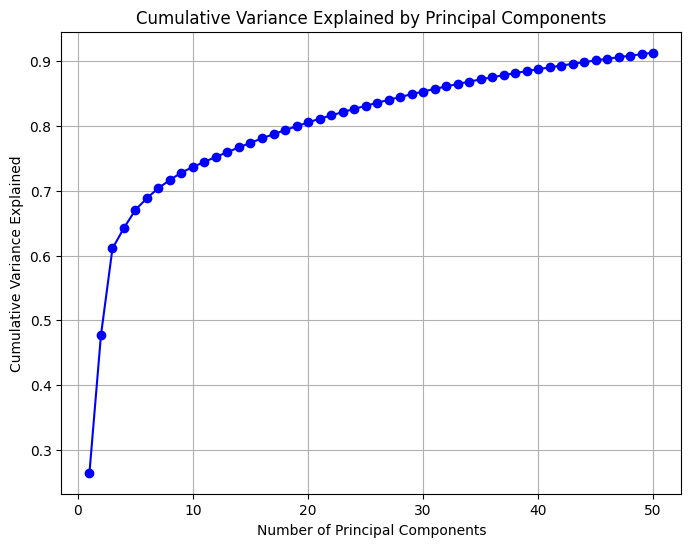

In [6]:
# Calculate cumulative variance explained
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Plot cumulative variance explained
plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, n_components + 1), cumulative_variance, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained by Principal Components')
plt.grid(True)
plt.show()

In [36]:
behav_df

,time,fwV,sideV,yawV,heading,abssideV,absyawV,net_motion,net_motion_state,heading_adj,odor,xPos,yPos,cluster_label_temporal,soft_cluster_label_temporal,cluster_label_spatial
0,0.000000,0.000000,0.000000,0.000000,1.751456,0.000000,0.000000,0.000000,0,1.751456,-0.000000,0.000000,0.000000,0,0,0
1,0.171684,5.994784,3.944763,3.623890,1.910944,3.944763,3.623890,13.563438,1,1.910944,-0.006682,0.206558,1.047305,0,0,0
2,0.343367,3.328190,-0.413015,6.563324,2.149969,0.413015,6.563324,10.304529,1,2.149969,-0.003543,0.423130,1.571824,0,0,0
3,0.515051,-0.141281,-1.482665,-5.231573,2.120900,1.482665,5.231573,6.855519,1,2.120900,-0.003918,0.396084,1.541127,0,0,0
4,0.686734,-2.312621,-12.226807,-9.127705,1.802799,12.226807,9.127705,23.667133,1,1.802799,-0.005372,0.253300,1.034170,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3549,609.304905,3.747693,23.181944,7.502550,2.845566,23.181944,7.502550,34.432186,1,-97.685399,9.760901,165.417606,443.362897,0,0,2
3550,609.476588,6.852808,3.354349,1.686122,3.044723,3.354349,1.686122,11.893278,1,-97.486242,9.759948,166.588623,443.663242,0,0,2
3551,609.648272,4.054921,-18.222478,-2.792821,3.015625,18.222478,2.792821,25.070220,1,-97.515340,9.753039,167.034231,443.986572,0,0,2
3552,609.819955,6.946215,-13.229453,-10.594823,2.678613,13.229453,10.594823,30.770491,1,-97.852351,9.740125,167.811576,444.727437,0,0,2


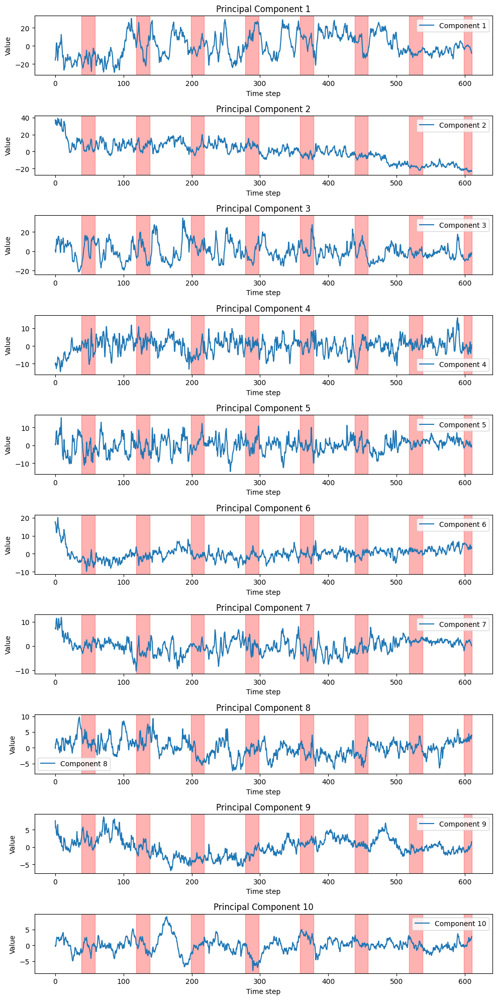

In [37]:
# visualze top PCstime_steps = range(transformed_data.shape[0])

n_components = 10
time_steps = range(transformed_data.shape[0])
# Check if 'odor' column exists and shade where odor > 5
if 'odor' in behav_df.columns:
    odor_mask = behav_df['odor'] > 5

# Create a figure with subplots
fig, axes = plt.subplots(n_components, 1, figsize=(10, 2*n_components))

for i in range(n_components):
    ax = axes[i]
    ax.plot(neural_df.time, transformed_data[:, i], label=f'Component {i+1}')
    ax.set_title(f'Principal Component {i+1}')
    ax.set_xlabel('Time step')
    ax.set_ylabel('Value')
    ax.legend()
    # Apply shading to all subplots
    ax.fill_between(behav_df['time'], ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3, transform=ax.get_xaxis_transform())
    

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

In [53]:
# Extract the first three PCs
pc1 = transformed_data[:, 0]
pc2 = transformed_data[:, 1]
pc3 = transformed_data[:, 2]

# Time steps for coloring
#phase = np.array(param_df.phase)
#heading = 2*np.pi - np.array(behav_df.heading)
x_pos = np.array([stat[i]['med'][0] for i in range(len(stat))])
x_pos_cell = x_pos[(iscell[:,0]==1)]
y_pos = np.array([stat[i]['med'][1] for i in range(len(stat))])
y_pos_cell = y_pos[(iscell[:,0]==1)]
heading = 2*np.pi-behav_df.heading
odor = behav_df.odor
phase = param_df.phase
amplitude = param_df.amplitude
baseline = param_df.baseline
# Create the figure
fig = go.Figure(data=[go.Scatter3d(
    x=pc1,
    y=pc2,
    z=pc3,
    mode='markers',
    marker=dict(
        size=5,
        color=odor, 
        colorscale='Viridis',  # Choose a color scale
        colorbar=dict(title='y position'),
        opacity=0.8
    )
)])

# Set the layout of the figure
fig.update_layout(
    title='Trajectory of the First 3 Principal Components in State Space',
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3'
    ),
    margin=dict(l=0, r=0, b=0, t=30)
)

# Show the figure
fig.show()


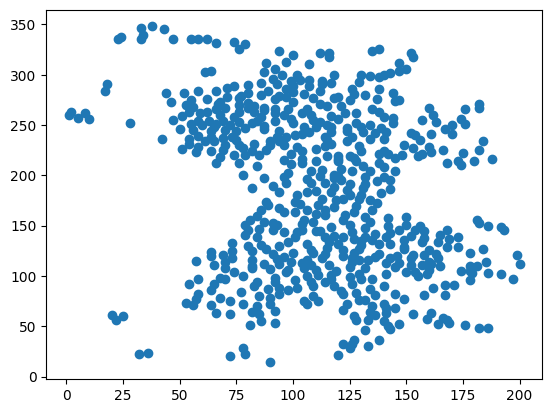

In [60]:
# visualize position of ROIs
plt.scatter(x_pos_cell,y_pos_cell)
# x_pos: within column
# y_pos: across columns

<Axes: >

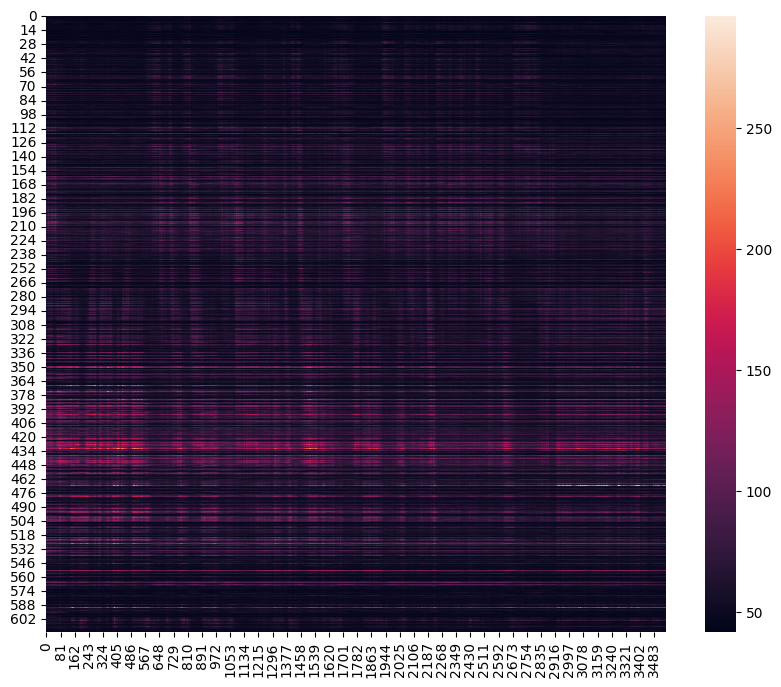

In [62]:
fig, ax = plt.subplots(figsize=(10,8))
sort_id_x = np.argsort(x_pos_cell)
sort_id_y = np.argsort(y_pos_cell)
sns.heatmap(F_cell[sort_id_y])

In [83]:
def dfoverf(F):
    # Determine F_0 using the 5th percentile of the fluorescence data
    F_0 = np.percentile(F, 5, axis=1)

    # Calculate ΔF/F
    deltaF_over_F = (F - F_0[:, np.newaxis]) / F_0[:, np.newaxis]
    return deltaF_over_F
dF_cell = dfoverf(F_cell)

<Axes: >

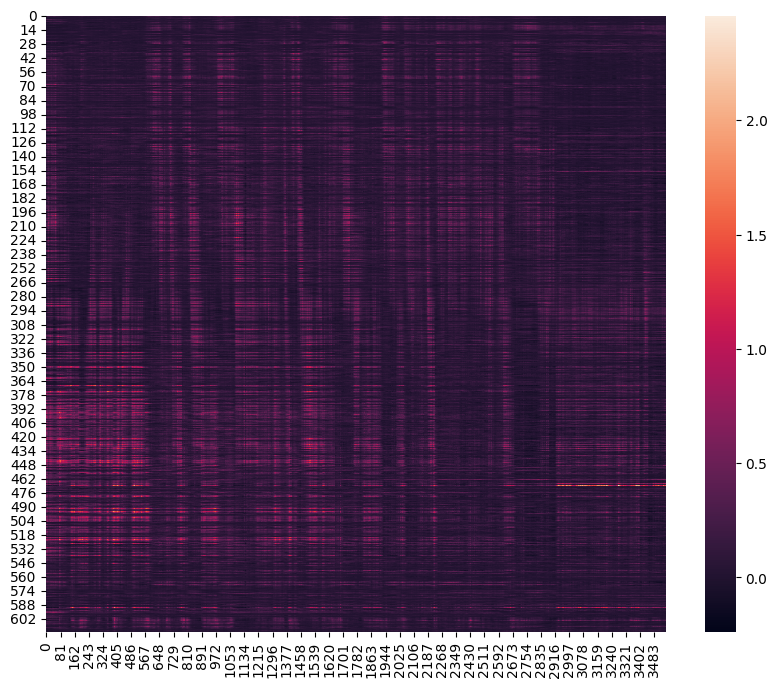

In [86]:
fig, ax = plt.subplots(figsize=(10,8))
sort_id_x = np.argsort(x_pos_cell)
sort_id_y = np.argsort(y_pos_cell)
sns.heatmap(dF_cell[sort_id_y])

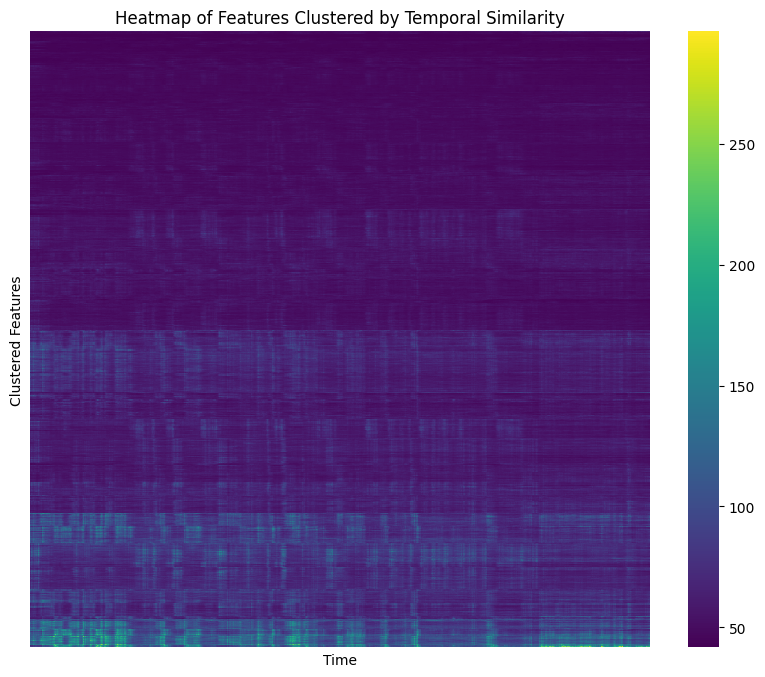

In [68]:
def hierachical_cluster(matrix, method='average', metric='euclidean'):
    """
    Clusters a matrix on the feature dimension based on temporal similarity and plots a heatmap.
    
    Parameters:
    - matrix: A 2D NumPy array with shape (features, time).
    - method: Method of clustering ('average', 'single', 'complete', etc.).
    - metric: Distance metric for clustering ('euclidean', 'cosine', etc.).
    """
    
    # Perform hierarchical clustering on the features
    Y = sch.linkage(matrix, method=method, metric=metric)
    Z = sch.dendrogram(Y, orientation='right', no_plot=True)  # 'no_plot=True' to not plot the dendrogram
    
    # Reorder the matrix according to the clustering
    index = Z['leaves']
    matrix_clustered = matrix[index, :]
    # Create a heatmap of the clustered matrix
    fig, ax = plt.subplots(figsize=(10,8))
    sns.heatmap(matrix_clustered, cmap='viridis', xticklabels=False, yticklabels=False)
    ax.set_title('Heatmap of Features Clustered by Temporal Similarity')
    ax.set_xlabel('Time')
    ax.set_ylabel('Clustered Features')
    plt.show()
    return Y, matrix_clustered

Y, F_cell_clus = hierachical_cluster(F_cell, method='average', metric='euclidean')

In [102]:
def cluster_dict_n(Y,last_x_step):
    # Initialize cluster labels for each original observation
    n = Y.shape[0] + 1  # Number of original observations
    cluster_labels = {i: [i] for i in range(n)}

    # Iterate over the linkage matrix
    for i, row in enumerate(Y[:n-1-last_x_step,:]):
        new_cluster_idx = n + i  # Index of the new cluster being formed
        cluster_i, cluster_j = int(row[0]), int(row[1])  # Clusters/observations being merged
        
        # Combine the labels from the clusters being merged into the new cluster
        cluster_labels[new_cluster_idx] = cluster_labels.pop(cluster_i) + cluster_labels.pop(cluster_j)
        
        # Optionally, print or store this information
        print(f"Step {i+1}: Merge clusters {cluster_i} and {cluster_j} into new cluster {new_cluster_idx}.")
    return cluster_labels
    # At this point, `cluster_labels` contains the labels for each step of the clustering

cluster_labels = cluster_dict_n(Y,4)


Step 1: Merge clusters 187 and 336 into new cluster 615.
Step 2: Merge clusters 97 and 323 into new cluster 616.
Step 3: Merge clusters 144 and 616 into new cluster 617.
Step 4: Merge clusters 117 and 234 into new cluster 618.
Step 5: Merge clusters 283 and 617 into new cluster 619.
Step 6: Merge clusters 21 and 85 into new cluster 620.
Step 7: Merge clusters 204 and 253 into new cluster 621.
Step 8: Merge clusters 260 and 328 into new cluster 622.
Step 9: Merge clusters 3 and 28 into new cluster 623.
Step 10: Merge clusters 158 and 166 into new cluster 624.
Step 11: Merge clusters 236 and 481 into new cluster 625.
Step 12: Merge clusters 619 and 622 into new cluster 626.
Step 13: Merge clusters 2 and 230 into new cluster 627.
Step 14: Merge clusters 172 and 364 into new cluster 628.
Step 15: Merge clusters 89 and 223 into new cluster 629.
Step 16: Merge clusters 91 and 155 into new cluster 630.
Step 17: Merge clusters 125 and 315 into new cluster 631.
Step 18: Merge clusters 156 and 3

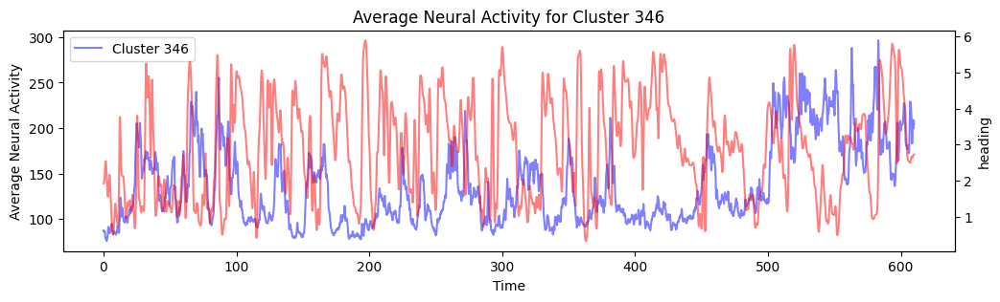

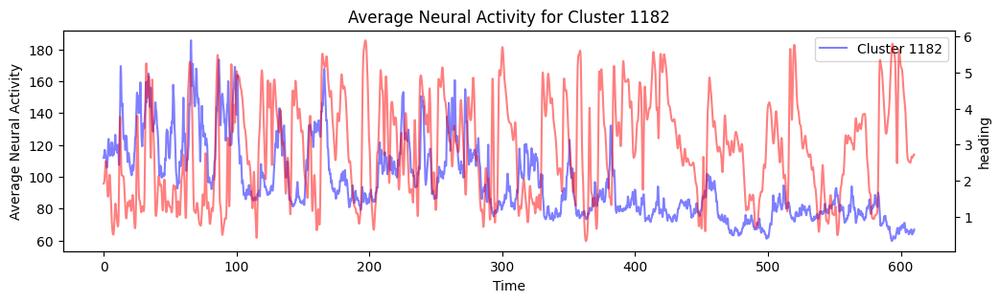

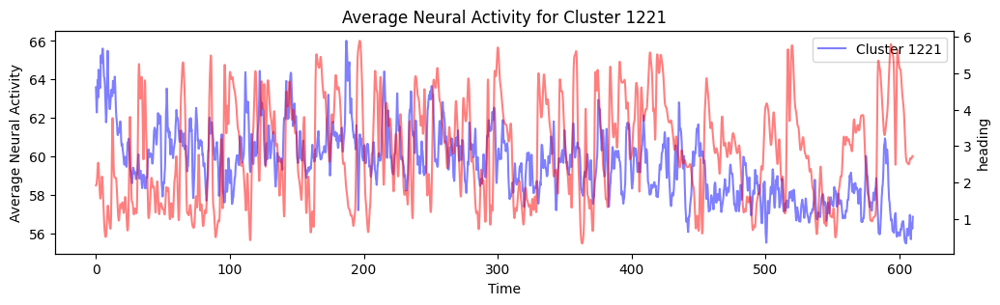

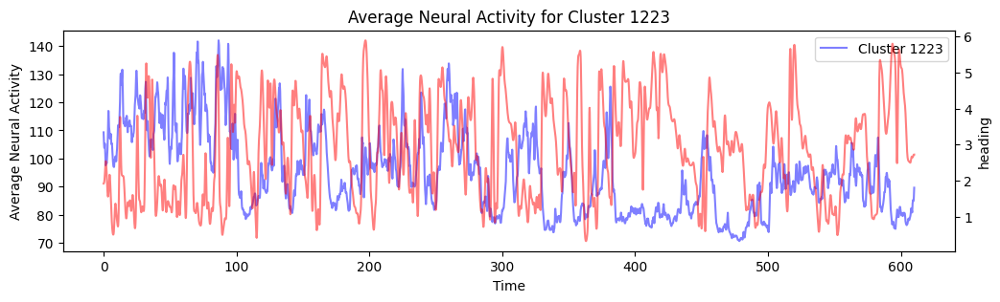

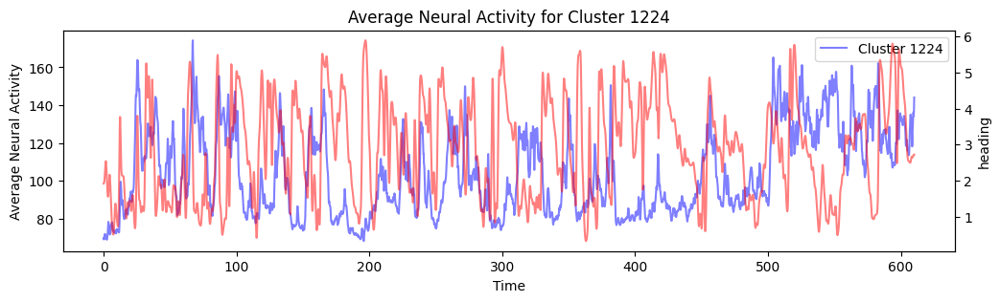

In [116]:
def plot_avg(F, cluster_labels, behav_df, ref_kw):
    for cluster_idx, roi_indices in cluster_labels.items():
        # Extract activities for the current cluster
        cluster_activities = F[roi_indices, :]
        
        # Compute the average activity over time for the cluster
        avg_activity = np.mean(cluster_activities, axis=0)
        
        # Plot the average activity
        fig, ax = plt.subplots(figsize=(12, 3))
        ax.plot(behav_df.time, avg_activity, label=f'Cluster {cluster_idx}',color = 'blue',alpha=0.5)
        ax2 = ax.twinx()
        ax2.plot(behav_df.time, imaging_behavior_functions.apply_gaussian_smoothing(behav_df[ref_kw],3),color = 'red', alpha=0.5)
        ax2.set_ylabel(ref_kw)
        ax.set_xlabel('Time')
        ax.set_ylabel('Average Neural Activity')
        ax.set_title(f'Average Neural Activity for Cluster {cluster_idx}')
        ax.legend()
        plt.show()

plot_avg(F_cell, cluster_labels, behav_df, 'heading')

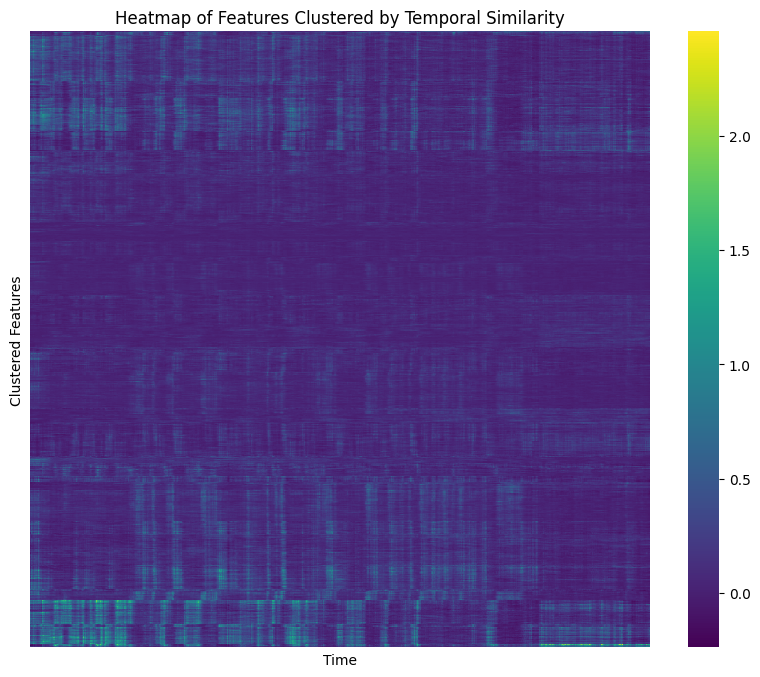

In [120]:
Y_dF, dF_cell_clus = hierachical_cluster(dF_cell, method='average', metric='euclidean')

Step 1: Merge clusters 187 and 336 into new cluster 615.
Step 2: Merge clusters 97 and 323 into new cluster 616.
Step 3: Merge clusters 117 and 234 into new cluster 617.
Step 4: Merge clusters 144 and 616 into new cluster 618.
Step 5: Merge clusters 283 and 618 into new cluster 619.
Step 6: Merge clusters 204 and 253 into new cluster 620.
Step 7: Merge clusters 236 and 615 into new cluster 621.
Step 8: Merge clusters 172 and 231 into new cluster 622.
Step 9: Merge clusters 364 and 617 into new cluster 623.
Step 10: Merge clusters 260 and 328 into new cluster 624.
Step 11: Merge clusters 21 and 85 into new cluster 625.
Step 12: Merge clusters 2 and 230 into new cluster 626.
Step 13: Merge clusters 3 and 28 into new cluster 627.
Step 14: Merge clusters 91 and 155 into new cluster 628.
Step 15: Merge clusters 89 and 223 into new cluster 629.
Step 16: Merge clusters 619 and 624 into new cluster 630.
Step 17: Merge clusters 418 and 517 into new cluster 631.
Step 18: Merge clusters 158 and 1

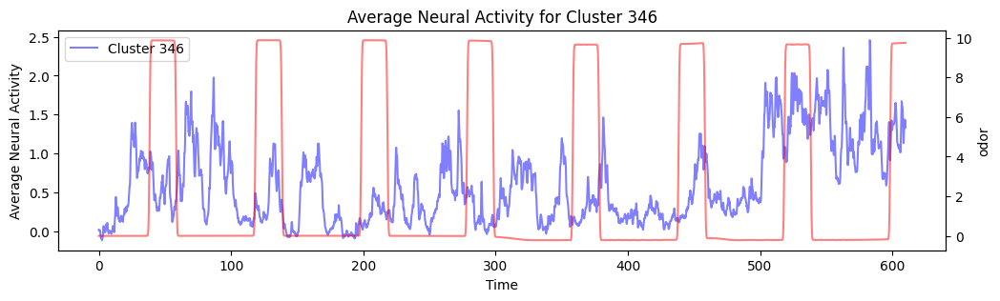

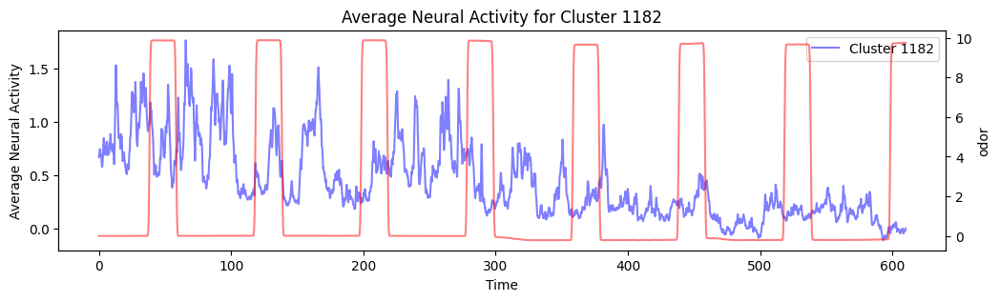

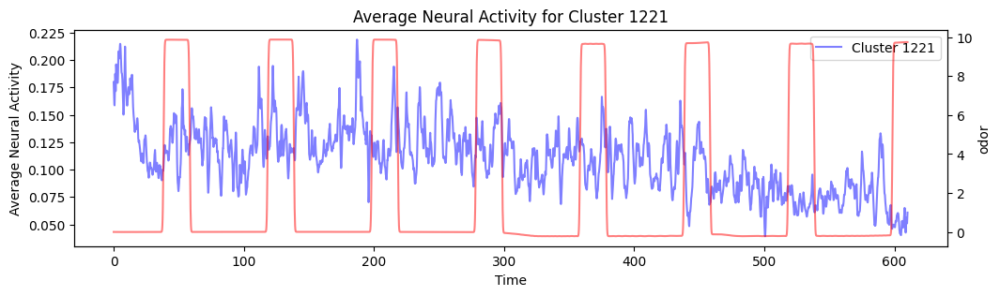

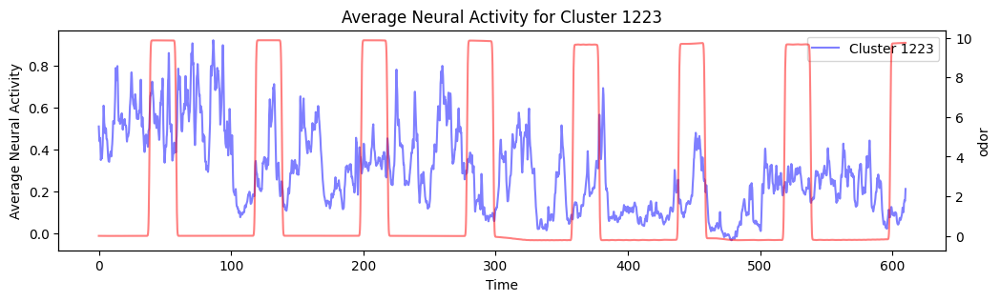

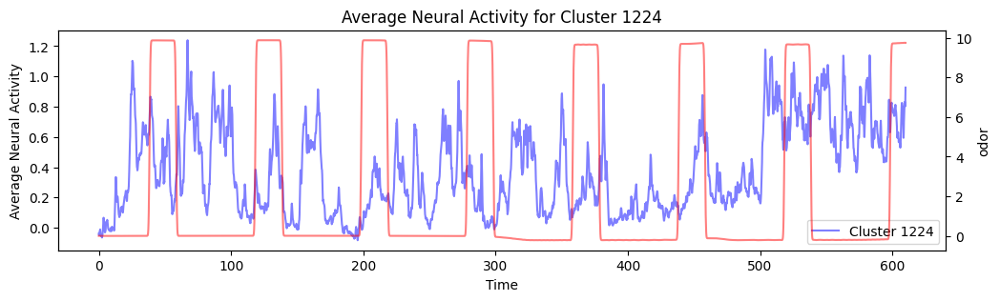

In [118]:
cluster_labels = cluster_dict_n(Y_dF,4)
plot_avg(dF_cell, cluster_labels, behav_df, 'odor')

## Rastermap

In [143]:
model = Rastermap(n_clusters=25, # number of clusters to compute
                  n_PCs=128, # number of PCs to use
                  locality=0.75, # locality in sorting to find sequences (this is a value from 0-1)
                  time_lag_window=5, # use future timepoints to compute correlation
                  grid_upsample=10, # default value, 10 is good for large recordings
                ).fit(dF_cell)
y = model.embedding # neurons x 1
isort = model.isort

normalizing data across axis=1
projecting out mean along axis=0
data normalized, 0.05sec
sorting activity: 615 valid samples by 3554 timepoints
n_PCs = 128 computed, 0.72sec
13 clusters computed, time 0.76sec
clusters sorted, time 0.77sec
clusters upsampled, time 0.80sec
rastermap complete, time 0.80sec


In [168]:
n_neurons, n_time = dF_cell.shape
nbin = 1 # number of neurons to bin over
ndiv = (n_neurons//nbin) * nbin
# group sorted matrix into rows of length nbin
sn = dF_cell[isort][:ndiv].reshape(ndiv//nbin, nbin, -1)
# take mean over neurons in a bin
sn = sn.mean(axis=1)

(-0.5, 0.5, 614.5, -0.5)

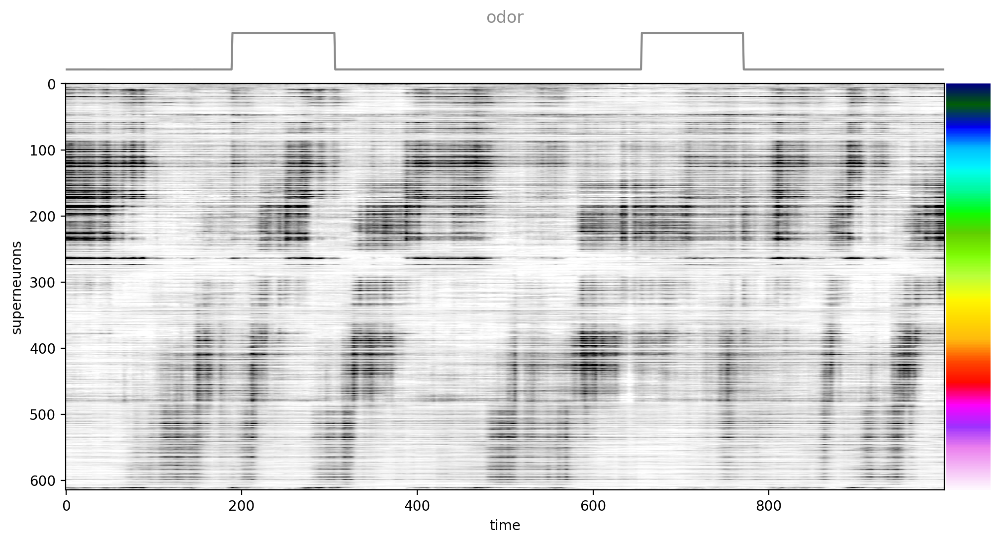

In [227]:
# timepoints to visualize
xmin = 500
xmax = xmin + 1000

# make figure with grid for easy plotting
fig = plt.figure(figsize=(12,6), dpi=200)
grid = plt.GridSpec(9, 20, figure=fig, wspace = 0.05, hspace = 0.3)

# colors for the behaviors
kp_colors = np.array([[0.55,0.55,0.55], [0.,0.,1],
                      [0.8,0,0], [1.,0.4,0.2],
                      [0,0.6,0.4], [0.2,1,0.5],
                      ])

# plot behavior
ax = plt.subplot(grid[0, :-1])
ax.plot(np.array(behav_df.odor[xmin:xmax]), color=kp_colors[0])
ax.set_xlim([0, xmax-xmin])
ax.axis("off")
ax.set_title("odor", color=kp_colors[0])

# plot superneuron activity
ax = plt.subplot(grid[1:, :-1])
ax.imshow(sn[:, xmin:xmax], cmap="gray_r", vmin=0, vmax=0.8, aspect="auto")
ax.set_xlabel("time")
ax.set_ylabel("superneurons")

ax = plt.subplot(grid[1:, -1])
ax.imshow(np.arange(0, len(sn))[:,np.newaxis], cmap="gist_ncar", aspect="auto")
ax.axis("off")

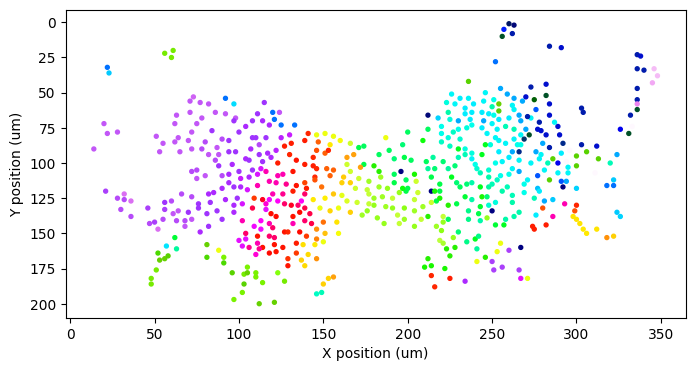

In [186]:
# POSITIONS OF ALL NEURONS
plt.figure(figsize=(8,4))
plt.scatter(y_pos_cell, x_pos_cell, s = 8, c=model.embedding[:,0], cmap="gist_ncar")
plt.xlabel('X position (um)')
plt.ylabel('Y position (um)')
plt.gca().invert_yaxis()
#plt.axis("square")

In [248]:
def map_to_bin(embedding, x_bins):
    # Define bin edges
    min_val = embedding.min()
    max_val = embedding.max()
    bins = np.linspace(min_val, max_val, x_bins + 1)  # +1 because we need edges for x bins

    # Map the embeddings to bin numbers
    bin_indices = np.digitize(embedding, bins, right=False) - 1  # Subtract 1 to make bin_indices start from 0

    # Create an array mapping embeddings to bin numbers
    mapped_embeddings = np.array([bin_indices[i] for i in range(len(embedding))])
    return mapped_embeddings

mapped_embeddings = map_to_bin(model.embedding[:,0], 9)

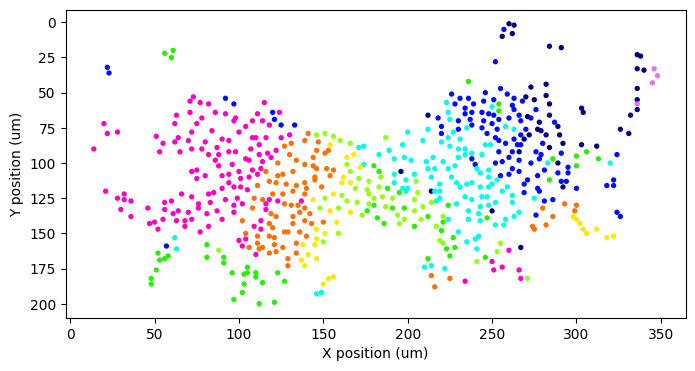

In [249]:
# POSITIONS OF ALL NEURONS
plt.figure(figsize=(8,4))
plt.scatter(y_pos_cell, x_pos_cell, s = 8, c=mapped_embeddings, cmap="gist_ncar")
plt.xlabel('X position (um)')
plt.ylabel('Y position (um)')
plt.gca().invert_yaxis()
#plt.axis("square")

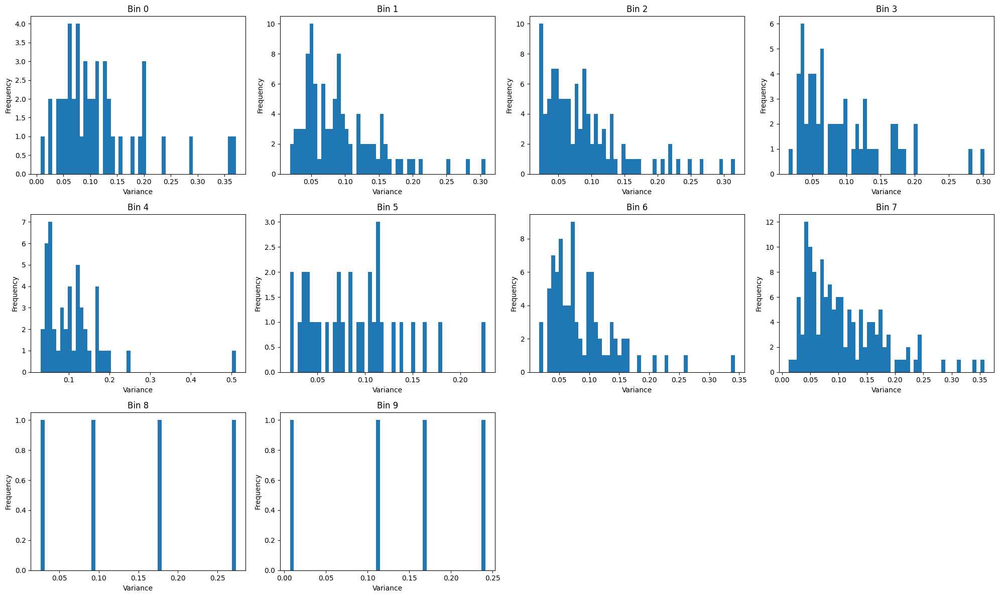

In [250]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming var_sn is already defined as you described
# Assuming mapped_embeddings is defined as previously discussed

# Determine the number of unique bins in mapped_embeddings
unique_bins = np.unique(mapped_embeddings)

# Determine the layout of subplots (trying for a square-ish layout)
n_bins = len(unique_bins)
n_cols = int(np.ceil(np.sqrt(n_bins)))
n_rows = int(np.ceil(n_bins / n_cols))

# Create a figure to host all subplots
plt.figure(figsize=(n_cols * 5, n_rows * 4))  # Adjust figure size as needed

# Loop through each unique bin and plot the histogram of variance values for that bin
for i, bin_index in enumerate(unique_bins):
    plt.subplot(n_rows, n_cols, i + 1)  # Create a subplot for each bin
    # Filter var_sn for the current bin and plot the histogram
    plt.hist(var_sn[mapped_embeddings == bin_index], bins=50)
    plt.title(f'Bin {bin_index}')
    plt.xlabel('Variance')
    plt.ylabel('Frequency')

plt.tight_layout()  # Adjust layout so plots do not overlap
plt.show()


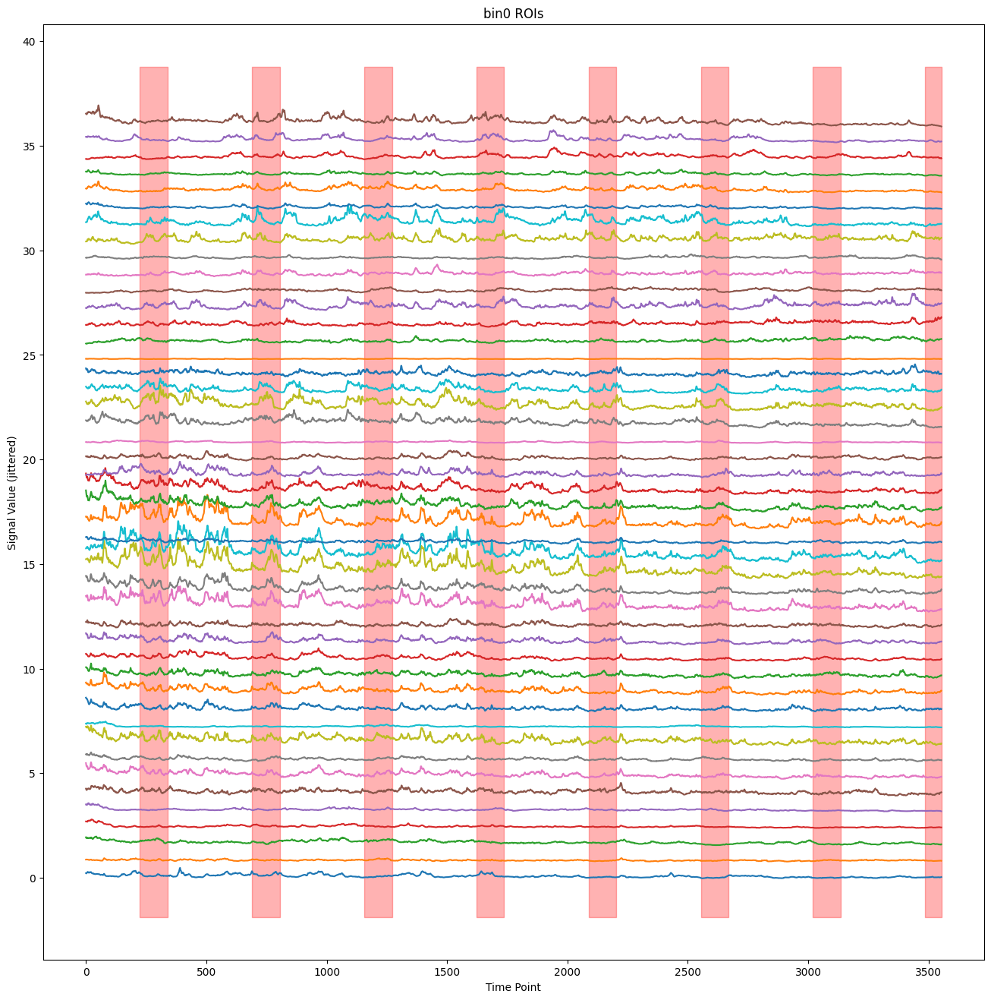

In [293]:
fig,ax = plt.subplots(figsize=(16, 16))
bin_index = 0
# Plot each signal with a jitter on the y-axis
y_offset = 0.8  # Adjust the offset value as needed
sn_binx = sn[mapped_embeddings == bin_index]
for i in range(len(sn_binx)):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin0 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()

In [262]:
# plot around odor delivery
def find_odor_start_end(behav_df):
    odor_on = behav_df[behav_df.odor > 5].index
    odor_start = [odor_on[0]]
    odor_end = []
    for i in range(len(odor_on)-1):
        if odor_on[i+1] - odor_on[i]>5:
            odor_start.append(odor_on[i+1])
            odor_end.append(odor_on[i])
    if odor_on[-1] != len(behav_df)-1:
        odor_end.append(odor_on[-1])
    return odor_start[0:len(odor_end)], odor_end
odor_start, odor_end = find_odor_start_end(behav_df)


[340, 806, 1271, 1737, 2203, 2669, 3135]

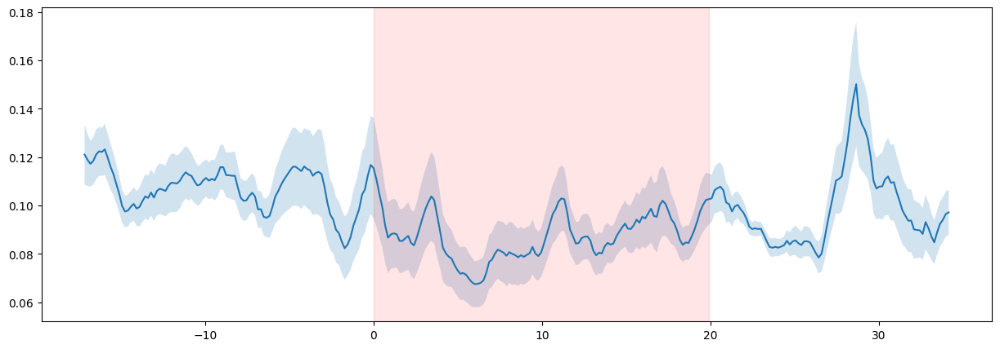

In [287]:
# start
fig_ex, ax = plt.subplots(figsize=[15,5])
odor_start, odor_end = find_odor_start_end(behav_df)
odor_all = []
for i in range(len(odor_start)-1):
    ind1 = odor_start[i]-100
    ind2 = odor_start[i]+200 
    odor_all.append(sn_binx[0,ind1:ind2])
    #ax.plot(behav_df.time[ind1:ind2]-behav_df.time[odor_start[i]], sn_binx[0,ind1:ind2],color='green',alpha = 0.5)
odor_mean = np.mean(np.array(odor_all),axis=0)
odor_std = np.std(np.array(odor_all),axis=0)/len(odor_all)
ax.plot(behav_df.time[ind1:ind2]-behav_df.time[odor_start[i]], odor_mean)
ax.fill_between(behav_df.time[ind1:ind2]-behav_df.time[odor_start[i]],odor_mean - odor_std, odor_mean + odor_std, alpha=0.2,)
ax.axvspan(0,behav_df.time[odor_end[0]]-behav_df.time[odor_start[0]], color='red',alpha=0.1)

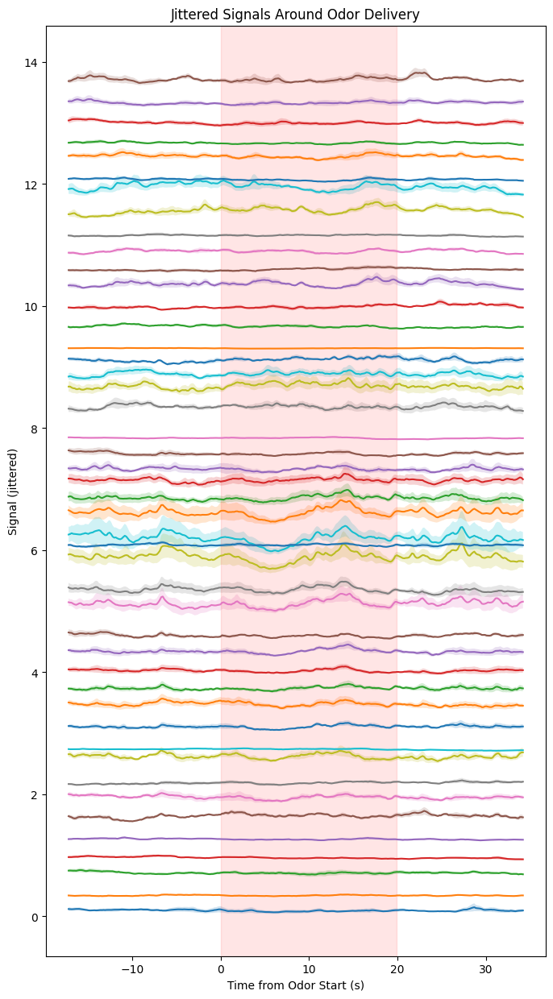

In [299]:
def plot_jittered_signals_around_odor(sn_binx, behav_df, y_jitter):
    """
    Plots all rows of sn_binx in a jittered manner on the y-axis around the odor delivery windows.

    Parameters:
    - sn_binx: 2D numpy array with dimensions (rows, time) representing signals to plot.
    - behav_df: DataFrame containing behavioral data, including time, odor_start, and odor_end.
    - y_jitter: float, the y-offset to apply between each row for clarity.
    """
    fig, ax = plt.subplots(figsize=[8,15])
    odor_start, odor_end = find_odor_start_end(behav_df)
    
    # Loop through each row in sn_binx
    for row_idx in range(sn_binx.shape[0]):
        odor_all = []
        for i in range(len(odor_start)-1):
            ind1 = odor_start[i] - 100
            ind2 = odor_start[i] + 200
            odor_all.append(sn_binx[row_idx, ind1:ind2])
        
        # Calculate mean and standard deviation for odor_all segments
        odor_mean = np.mean(np.array(odor_all), axis=0)
        odor_std = np.std(np.array(odor_all), axis=0) / np.sqrt(len(odor_all))  # Standard Error of the Mean (SEM)
        
        # Plot the mean signal for each row with y-offset
        ax.plot(behav_df.time[ind1:ind2] - behav_df.time[odor_start[i]], odor_mean + (row_idx * y_jitter), label=f'Row {row_idx}')
        
        # Optional: Add fill_between for SEM or STD
        ax.fill_between(behav_df.time[ind1:ind2] - behav_df.time[odor_start[i]],
                         odor_mean - odor_std + (row_idx * y_jitter),
                         odor_mean + odor_std + (row_idx * y_jitter), alpha=0.2)

    # Highlight the odor delivery window
    ax.axvspan(0, behav_df.time[odor_end[0]] - behav_df.time[odor_start[0]], color='red', alpha=0.1)
    
    plt.xlabel('Time from Odor Start (s)')
    plt.ylabel('Signal (jittered)')
    plt.title('Jittered Signals Around Odor Delivery')
    #plt.legend()
plot_jittered_signals_around_odor(sn_binx, behav_df, 0.3)

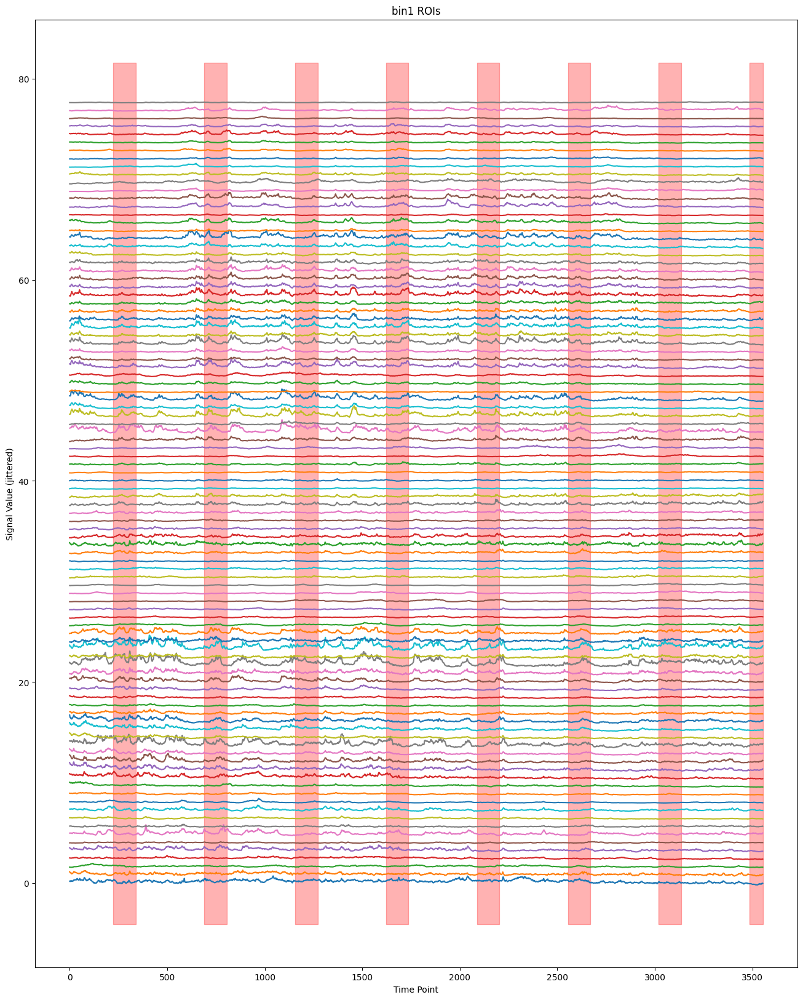

In [252]:
fig,ax = plt.subplots(figsize=(16, 20))
bin_index = 1
# Plot each signal with a jitter on the y-axis
y_offset = 0.8  # Adjust the offset value as needed
sn_binx = sn[mapped_embeddings == bin_index]
for i in range(len(sn_binx)):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin1 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()

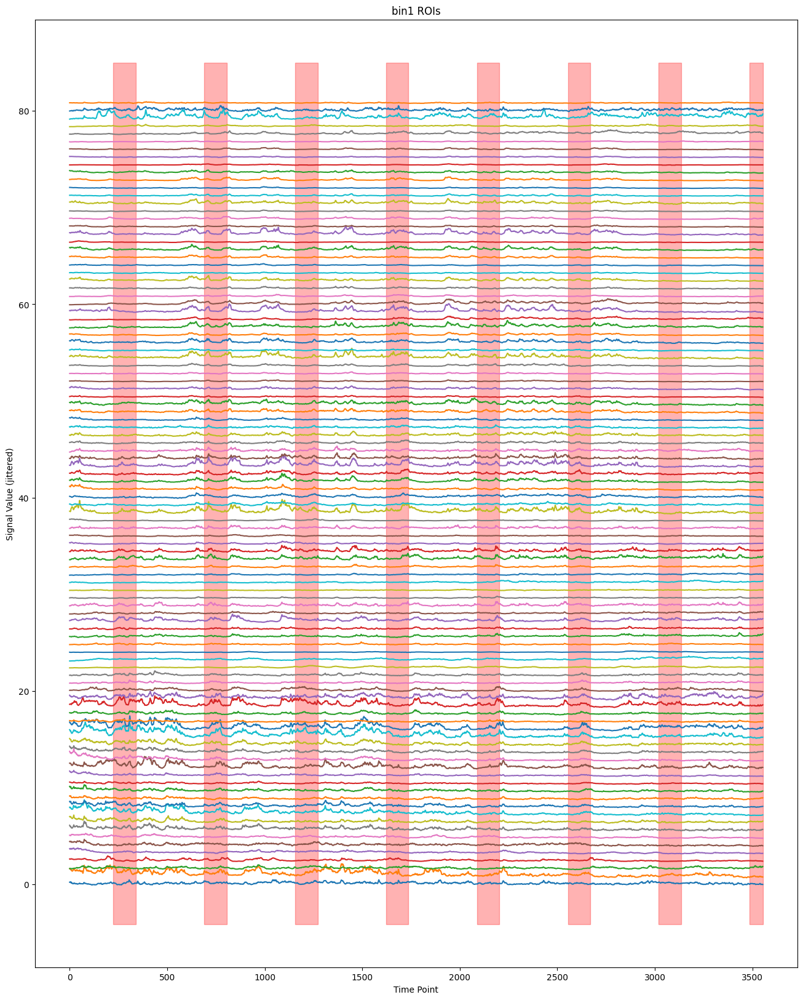

In [253]:
fig,ax = plt.subplots(figsize=(16, 20))
bin_index = 2
# Plot each signal with a jitter on the y-axis
y_offset = 0.8  # Adjust the offset value as needed
sn_binx = sn[mapped_embeddings == bin_index]
for i in range(len(sn_binx)):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin1 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()